### Import dependencies

In [71]:
from pathlib import Path
import pandas as pd
import os
import random
from PIL import Image
import plotly.express as px
import torchvision.transforms as T

### Define paths for poster images and corresponsing csv

In [17]:
# Base path
base_path = Path("../../raw_data/posters")
# CSV paths
train_path = base_path.joinpath("csvs")
# Image folders paths
img_train_path = base_path.joinpath("images")

### Import csv as a DataFrame

In [26]:
df_train = pd.read_csv(train_path.joinpath('movies_train.csv'))
print(df_train.shape)
df_train.head(3)

(5000, 8)


,Title,Year,Genre,Poster,imdbID,Director,Writer,Actors
0,The Pilot,1980.0,"['Action', 'Drama']",https://m.media-amazon.com/images/M/MV5BOGRhYm...,tt0079719,Cliff Robertson,Robert P. Davis,"Cliff Robertson, Diane Baker, Frank Converse"
1,Quartermaine's Terms,1980.0,['Drama'],https://m.media-amazon.com/images/M/MV5BOWY5OT...,tt0093806,Bill Hays,Simon Gray,"Edward Fox, John Gielgud, Eleanor Bron"
2,Black Fire,1980.0,"['Action', 'Crime']",https://m.media-amazon.com/images/M/MV5BN2RjNm...,tt0313286,Teddy Page,"Jim Gaines, Teddy Page","Romano Kristoff, Jim Gaines, Ruel Vernal"


### Check if all poster images in csv exist

In [29]:
def check_df_vs_folder(df, folder_name):
  # Makes a list of all imdbIDs in df
  df_list = list(df["imdbID"])
  missing = []

  # Checks to make sure each id in list is present in folder
  for file_name in df_list:
    if not os.path.isfile(folder_name.joinpath(f'{file_name}.jpg')):
      # print(folder_name, ":", file_name)
      missing.append(file_name)
  return missing

In [31]:
missing_list = check_df_vs_folder(df_train, img_train_path)
len(missing_list)

0

#### **All images exist**

### Print a random image

This is the image size in pixels (width, height):  (1200, 1711)


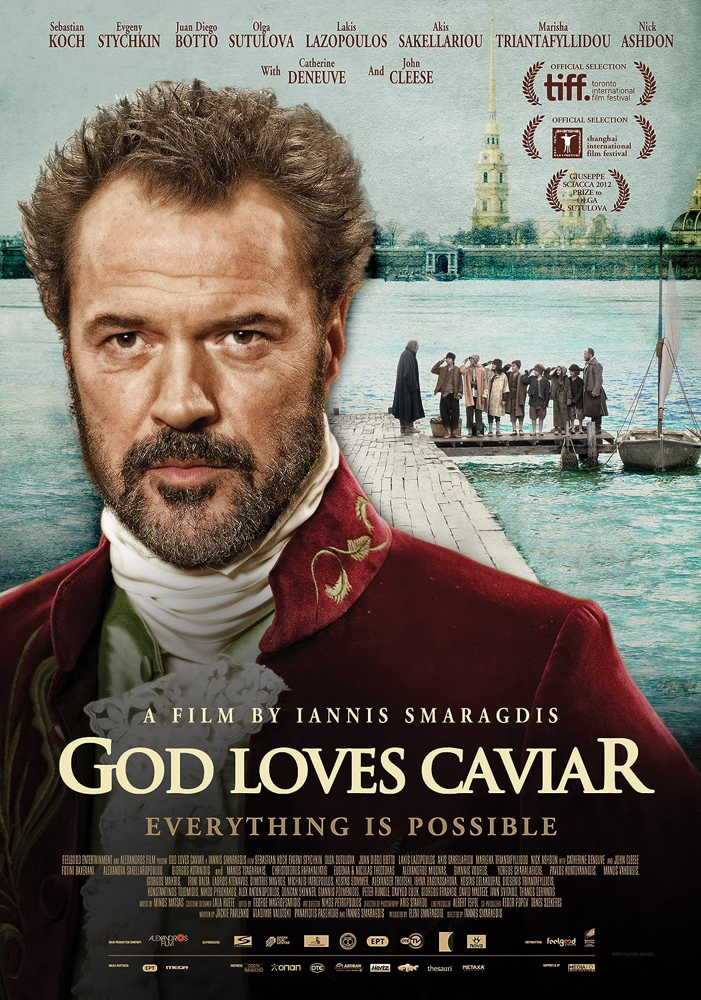

In [36]:
random_img_list = list(img_train_path.glob("*.jpg"))

img = random.choice(random_img_list)
img = Image.open(img)
print("This is the image size in pixels (width, height): ", img.size)
img

### Image size exploration

In [37]:
### Image size exploration
image_width=[]
image_height=[]

for image in img_train_path.glob("*.jpg"):
    im = Image.open(image)
    width, height = im.size
    image_width.append(width)
    image_height.append(height)


In [47]:
fig = px.scatter(x=image_width, y=image_height)
fig.show()

#### The distribution of image sizes is quite disperse. If we **wish to work with small images**, then we need to do something else. Let's explore the **aspect ratio** of the images instead. Maybe the answer lies there. 

### Image ratio exploration

In [81]:
### Image ratio exploration
image_ratios = []
image_name = []
aspect_ratio_range = (1.3, 2.9)
picture_count = 0
picture_within_ratio_count = 0

for image in img_train_path.glob("*.jpg"):
    im = Image.open(image)
    width, height = im.size
    ratio = round(height/width,1)
    image_ratios.append(ratio)
    image_name.append(image.stem)
    if ratio <= aspect_ratio_range[1] and ratio >= aspect_ratio_range[0]:
        picture_within_ratio_count += 1
    picture_count+=1

print('Total picture count: ', picture_count)
print('Pictures within ratio count: ', picture_within_ratio_count)
print('Proportion of images within range: ', picture_within_ratio_count/picture_count)
fig = px.histogram(image_ratios)
fig.show()

Total picture count:  5000
Pictures within ratio count:  4662
Proportion of images within range:  0.9324


#### Print a random image that's within a specific ratio

This is the image size in pixels (width, height):  (1080, 1080)


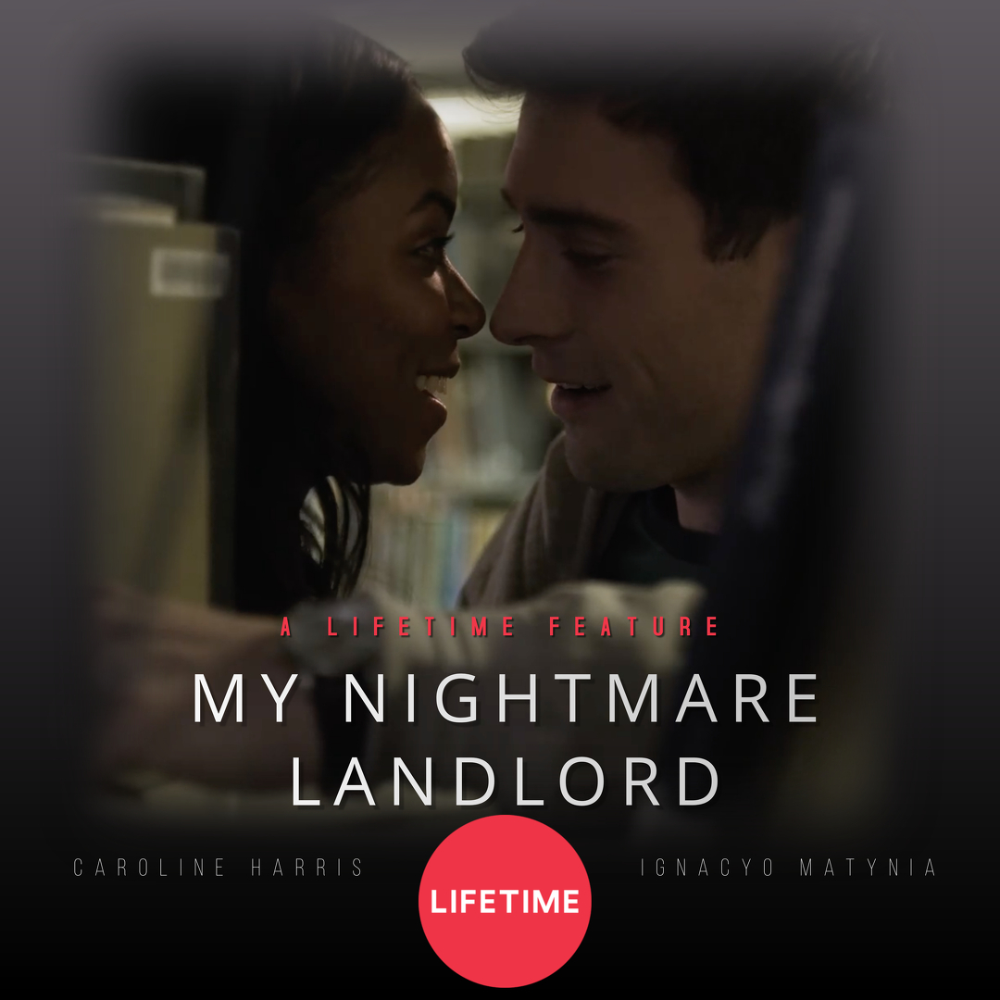

In [84]:
# Define the ratio you're interested in:
ratio = 1
# Filter the indexes of the images that comply with this ratio:
specific_ratio_index = [i for i,x in enumerate(image_ratios) if x==ratio]
# Get the corresponding image names to be able to fetch them from their directory
img_ids = [image_name[index] for index in specific_ratio_index]
# Choose a random image and print it
img = random.choice(img_ids)
img = Image.open(img_train_path.joinpath(f'{img}.jpg'))
print("This is the image size in pixels (width, height): ", img.size)
img

#### You will notice most of the horizontal format pictures (ex. ratio = 0.8 [height/width]) are just pictures without text (not a poster). We should drop those. Also, if we discard those, **we still keep 93% of the images**.

### Rescale images

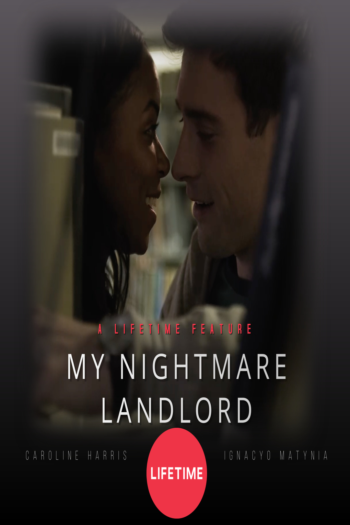

In [85]:
# Rescale image
transform = T.Resize((525,350)) #1.5 ratio
resized_img = transform(img)
resized_img

#### Images with an aspect ratio of 2.5 to 3 still have readable text (to human's eyes) after resizing. We can keep these images.

In [97]:
# Initialize lists
specific_ratio_index = []
img_ids = []
# Define save to path
resized_path = Path("../../raw_data/posters_resized")
# Filter the indexes of the images within the desired ratio:
specific_ratio_index = [i for i,x in enumerate(image_ratios) if 1.3 <= x <= 2.9]
# Get the corresponding image names:
img_ids = [image_name[index] for index in specific_ratio_index]
# Resize each picture and save them to the new folder
transform = T.Resize((525,350))
for image in img_ids:
    img = Image.open(img_train_path.joinpath(f'{image}.jpg'))
    resized_img = transform(img)
    resized_img.save(resized_path.joinpath(f'{image}.jpg'))

#### For images that were, for example 1200 X 2000 pixels (2,400,000 pixels total) and we resized down to 350 X 525 (183,750 pixels total), we will have indirectly **reduced the processing times later on while training the model by 13 times!**